In [3]:
import xml.etree.ElementTree as xet
import os
import pandas as pd

In [4]:
labels_dict = {
    'labelpath': [],
    'imagepath': [],
    'xmin': [],
    'xmax': [],
    'ymin': [],
    'ymax': []
}

for file in sorted(os.listdir(path)):

    if file.lower().endswith('.xml'):

        xml_path = os.path.join(path, file)

        info = xet.parse(xml_path)
        root = info.getroot()

        obj = root.find('object')
        l_info = obj.find('bndbox')

        xmin = int(l_info.find('xmin').text)
        xmax = int(l_info.find('xmax').text)
        ymin = int(l_info.find('ymin').text)
        ymax = int(l_info.find('ymax').text)

        base_name = os.path.splitext(file)[0]

        image_extensions = ['.jpeg', '.jpg', '.png']
        image_path = None

        for ext in image_extensions:
            temp_path = os.path.join(path, base_name + ext)

            if os.path.exists(temp_path):
                image_path = temp_path
                break

        if image_path is not None:

            labels_dict['labelpath'].append(xml_path)
            labels_dict['imagepath'].append(image_path)
            labels_dict['xmin'].append(xmin)
            labels_dict['xmax'].append(xmax)
            labels_dict['ymin'].append(ymin)
            labels_dict['ymax'].append(ymax)

In [5]:
df = pd.DataFrame(labels_dict)

print("Total labelled image/XML pairs:", len(df))

df.head()

Total labelled image/XML pairs: 225


,labelpath,imagepath,xmin,xmax,ymin,ymax
0,C:\Users\Admin\Downloads\archive (7)\images\N1...,C:\Users\Admin\Downloads\archive (7)\images\N1...,1093,1396,645,727
1,C:\Users\Admin\Downloads\archive (7)\images\N1...,C:\Users\Admin\Downloads\archive (7)\images\N1...,134,301,312,350
2,C:\Users\Admin\Downloads\archive (7)\images\N1...,C:\Users\Admin\Downloads\archive (7)\images\N1...,31,139,128,161
3,C:\Users\Admin\Downloads\archive (7)\images\N1...,C:\Users\Admin\Downloads\archive (7)\images\N1...,164,316,216,243
4,C:\Users\Admin\Downloads\archive (7)\images\N1...,C:\Users\Admin\Downloads\archive (7)\images\N1...,813,1067,665,724


In [6]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

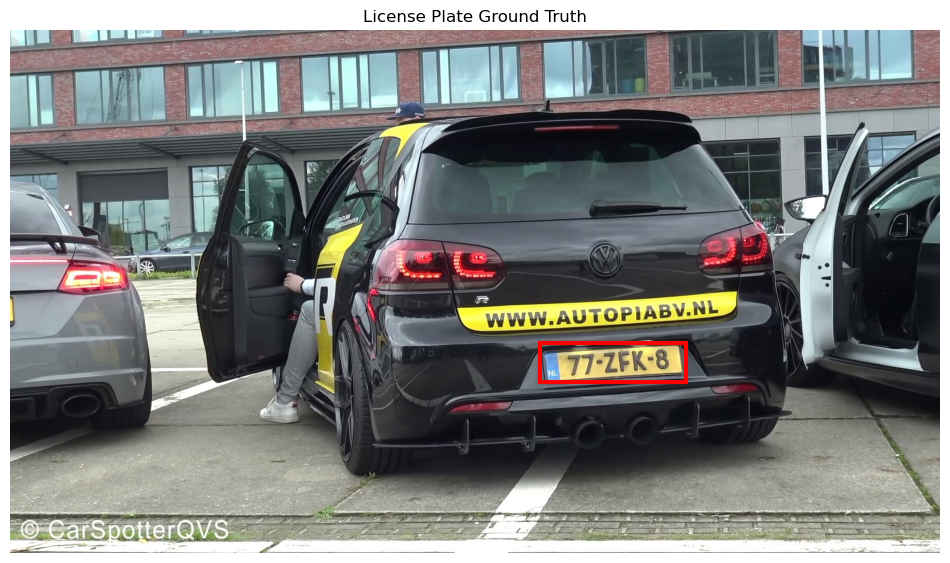

In [7]:
index = 0

image_path = df.iloc[index]['imagepath']

img = cv2.cvtColor(
    cv2.imread(image_path),
    cv2.COLOR_BGR2RGB
)

xmin = df.iloc[index]['xmin']
xmax = df.iloc[index]['xmax']
ymin = df.iloc[index]['ymin']
ymax = df.iloc[index]['ymax']

fig, ax = plt.subplots(figsize=(12, 8))

ax.imshow(img)

rect = patches.Rectangle(
    (xmin, ymin),
    xmax - xmin,
    ymax - ymin,
    linewidth=3,
    edgecolor='red',
    facecolor='none'
)

ax.add_patch(rect)

plt.title("License Plate Ground Truth")
plt.axis('off')

plt.show()

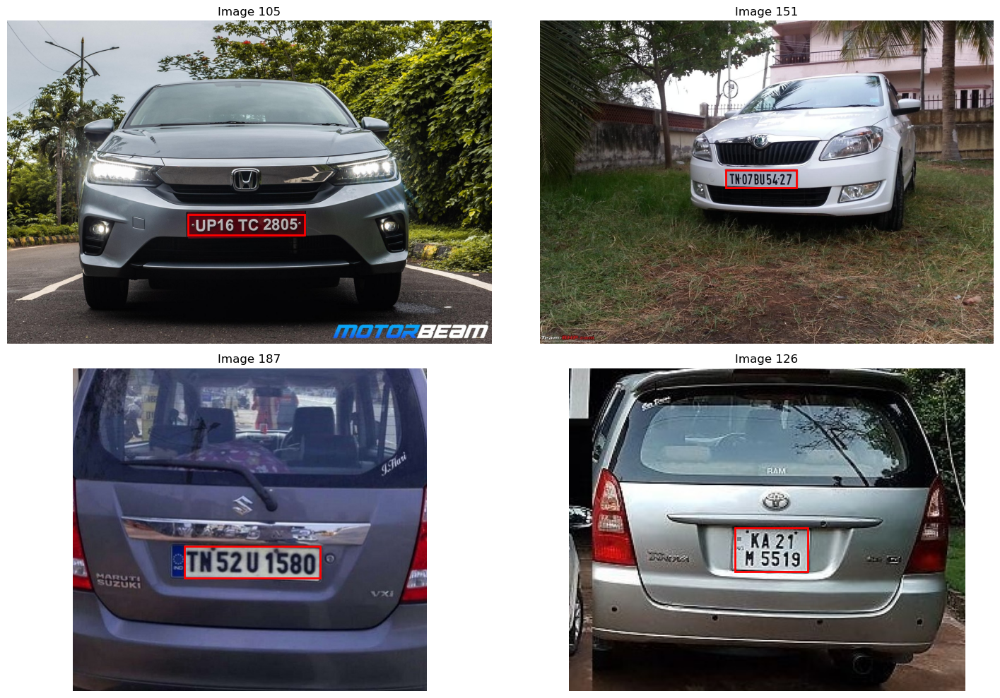

In [8]:
import random

random_indices = random.sample(range(len(df)), 4)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for ax, index in zip(axes.flatten(), random_indices):

    image_path = df.iloc[index]['imagepath']

    img = cv2.cvtColor(
        cv2.imread(image_path),
        cv2.COLOR_BGR2RGB
    )

    xmin = df.iloc[index]['xmin']
    xmax = df.iloc[index]['xmax']
    ymin = df.iloc[index]['ymin']
    ymax = df.iloc[index]['ymax']

    ax.imshow(img)

    rect = patches.Rectangle(
        (xmin, ymin),
        xmax - xmin,
        ymax - ymin,
        linewidth=2,
        edgecolor='red',
        facecolor='none'
    )

    ax.add_patch(rect)

    ax.set_title(f"Image {index}")
    ax.axis('off')

plt.tight_layout()
plt.show()

In [9]:
image_sizes = []

for image_path in df['imagepath']:

    img = cv2.imread(image_path)

    if img is not None:

        h, w, c = img.shape

        image_sizes.append((w, h))

image_sizes[:10]

[(1920, 1080),
 (450, 417),
 (249, 239),
 (478, 395),
 (1800, 1200),
 (377, 244),
 (500, 289),
 (610, 485),
 (441, 363),
 (484, 456)]

In [10]:
from collections import Counter

size_counts = Counter(image_sizes)

print("Number of different image sizes:", len(size_counts))

print("\nMost common image sizes:")

for size, count in size_counts.most_common(10):
    print(size, ":", count)

Number of different image sizes: 190

Most common image sizes:
(1920, 1080) : 14
(600, 337) : 5
(600, 450) : 3
(500, 333) : 3
(500, 332) : 3
(586, 331) : 2
(400, 300) : 2
(602, 339) : 2
(960, 1280) : 2
(960, 720) : 2


In [11]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

In [12]:
data = []
output = []

for i in range(len(df)):

    image_path = df.iloc[i]['imagepath']

    img_arr = cv2.imread(image_path)

    if img_arr is None:
        print("Could not read:", image_path)
        continue

    h, w, _ = img_arr.shape

    # Load and resize image
    image = load_img(
        image_path,
        target_size=(224, 224)
    )

    image_array = img_to_array(image)

    # Normalize pixel values
    image_array = image_array / 255.0

    # Original bounding box coordinates
    xmin = df.iloc[i]['xmin']
    xmax = df.iloc[i]['xmax']
    ymin = df.iloc[i]['ymin']
    ymax = df.iloc[i]['ymax']

    # Normalize bounding box coordinates
    nxmin = xmin / w
    nxmax = xmax / w
    nymin = ymin / h
    nymax = ymax / h

    # Store image and label
    data.append(image_array)

    output.append([
        nxmin,
        nxmax,
        nymin,
        nymax
    ])

print("Preprocessing complete!")

Preprocessing complete!


In [13]:
X = np.array(data, dtype=np.float32)
y = np.array(output, dtype=np.float32)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (225, 224, 224, 3)
y shape: (225, 4)


In [14]:
print("\nFirst bounding box:")
print(y[0])

print("\nMinimum coordinate:", y.min())
print("Maximum coordinate:", y.max())


First bounding box:
[0.56927085 0.7270833  0.5972222  0.67314816]

Minimum coordinate: 0.0032520324
Maximum coordinate: 1.0


In [15]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=42
)

print("Training images:", len(x_train))
print("Validation images:", len(x_test))

Training images: 180
Validation images: 45


In [16]:
print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (225, 224, 224, 3)
y shape: (225, 4)


In [17]:
import tensorflow as tf

from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import (
    Dense,
    Input,
    GlobalAveragePooling2D,
    Dropout
)
from tensorflow.keras.models import Model

In [18]:
base_model = InceptionResNetV2(
    weights='imagenet',
    include_top=False,
    input_tensor=Input(shape=(224, 224, 3))
)

# Freeze the pretrained CNN
base_model.trainable = False

# Add our custom layers
headmodel = base_model.output

headmodel = GlobalAveragePooling2D()(headmodel)

headmodel = Dense(
    256,
    activation='relu'
)(headmodel)

headmodel = Dropout(0.3)(headmodel)

headmodel = Dense(
    128,
    activation='relu'
)(headmodel)

# Four normalized bounding box coordinates
output_layer = Dense(
    4,
    activation='sigmoid'
)(headmodel)

model = Model(
    inputs=base_model.input,
    outputs=output_layer
)


219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 32s 0us/step


In [19]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d (Conv2D)               │ (None, 111, 111, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization           │ (None, 111, 111, 32)      │              96 │ conv2d[0][0]               │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation (Activation)       │ (None, 111, 111, 32)      │               0 │ batch_normalization[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_1 (Conv2D)             │ (None, 109, 109, 32)      │           9,216 │ activation[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_1         │ (None, 109, 109, 32)      │              96 │ conv2d_1[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_1 (Activation)     │ (None, 109, 109, 32)      │               0 │ batch_normalization_1[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_2 (Conv2D)             │ (None, 109, 109, 64)      │          18,432 │ activation_1[0][0]         │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_2         │ (None, 109, 109, 64)      │             192 │ conv2d_2[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_2 (Activation)     │ (None, 109, 109, 64)      │               0 │ batch_normalization_2[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d (MaxPooling2D)  │ (None, 54, 54, 64)        │               0 │ activation_2[0][0]         │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_3 (Conv2D)             │ (None, 54, 54, 80)        │           5,120 │ max_pooling2d[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_3         │ (None, 54, 54, 80)        │             240 │ conv2d_3[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_3 (Activation)     │ (None, 54, 54, 80)        │               0 │ batch_normalization_3[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_4 (Conv2D)             │ (None, 52, 52, 192)       │         138,240 │ activation_3[0][0]         │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 54,763,620 (208.91 MB)

 Trainable params: 426,884 (1.63 MB)

 Non-trainable params: 54,336,736 (207.28 MB)

In [20]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=0.0001
    ),
    loss='mse'
)

In [21]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau,
    ModelCheckpoint
)

callbacks = [

    EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    ),

    ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-7,
        verbose=1
    ),

    ModelCheckpoint(
        'best_number_plate_model.keras',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

In [22]:
history = model.fit(
    x_train,
    y_train,

    validation_data=(x_test, y_test),

    batch_size=8,

    epochs=3,

    callbacks=callbacks,

    verbose=1
)

Epoch 1/3
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 904ms/step - loss: 0.0354
Epoch 1: val_loss improved from None to 0.01987, saving model to best_number_plate_model.keras

Epoch 1: finished saving model to best_number_plate_model.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - loss: 0.0354 - val_loss: 0.0199 - learning_rate: 1.0000e-04
Epoch 2/3
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 935ms/step - loss: 0.0262
Epoch 2: val_loss did not improve from 0.01987
23/23 ━━━━━━━━━━━━━━━━━━━━ 27s 1s/step - loss: 0.0262 - val_loss: 0.0202 - learning_rate: 1.0000e-04
Epoch 3/3
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 918ms/step - loss: 0.0222
Epoch 3: val_loss improved from 0.01987 to 0.01886, saving model to best_number_plate_model.keras

Epoch 3: finished saving model to best_number_plate_model.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - loss: 0.0222 - val_loss: 0.0189 - learning_rate: 1.0000e-04


In [23]:
history2 = model.fit(
    x_train,
    y_train,

    validation_data=(x_test, y_test),

    batch_size=8,

    epochs=30,

    callbacks=callbacks,

    verbose=1
)

Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 975ms/step - loss: 0.0215
Epoch 1: val_loss improved from 0.01886 to 0.01749, saving model to best_number_plate_model.keras

Epoch 1: finished saving model to best_number_plate_model.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - loss: 0.0215 - val_loss: 0.0175 - learning_rate: 1.0000e-04
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 921ms/step - loss: 0.0179
Epoch 2: val_loss improved from 0.01749 to 0.01744, saving model to best_number_plate_model.keras

Epoch 2: finished saving model to best_number_plate_model.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - loss: 0.0179 - val_loss: 0.0174 - learning_rate: 1.0000e-04
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 967ms/step - loss: 0.0180
Epoch 3: val_loss improved from 0.01744 to 0.01693, saving model to best_number_plate_model.keras

Epoch 3: finished saving model to best_number_plate_model.keras
23/23 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step - loss: 0.0180 - val_loss: 0.0169 - learning_rate: 1.0000e-04
Epoch 4

In [24]:
import os

print(os.path.exists("best_number_plate_model.keras"))

True


In [25]:
from tensorflow.keras.models import load_model

best_model = load_model("best_number_plate_model.keras")

print("Best model loaded successfully!")

Best model loaded successfully!


In [26]:
predictions = best_model.predict(x_test)

print("Predictions shape:", predictions.shape)

2/2 ━━━━━━━━━━━━━━━━━━━━ 17s 7s/step
Predictions shape: (45, 4)


In [27]:
def calculate_iou(true_box, pred_box):

    # Coordinates are:
    # [xmin, xmax, ymin, ymax]

    xmin_inter = max(true_box[0], pred_box[0])
    xmax_inter = min(true_box[1], pred_box[1])

    ymin_inter = max(true_box[2], pred_box[2])
    ymax_inter = min(true_box[3], pred_box[3])

    # Intersection dimensions
    inter_width = max(0, xmax_inter - xmin_inter)
    inter_height = max(0, ymax_inter - ymin_inter)

    intersection = inter_width * inter_height

    # True box area
    true_area = (
        max(0, true_box[1] - true_box[0]) *
        max(0, true_box[3] - true_box[2])
    )

    # Predicted box area
    pred_area = (
        max(0, pred_box[1] - pred_box[0]) *
        max(0, pred_box[3] - pred_box[2])
    )

    # Union
    union = true_area + pred_area - intersection

    if union <= 0:
        return 0

    return intersection / union

In [28]:
ious = []

for true_box, pred_box in zip(y_test, predictions):

    iou = calculate_iou(true_box, pred_box)
    ious.append(iou)

mean_iou = np.mean(ious)

print("Mean IoU:", mean_iou)
print("Maximum IoU:", np.max(ious))
print("Minimum IoU:", np.min(ious))

Mean IoU: 0.17504466
Maximum IoU: 0.68312633
Minimum IoU: 0.0


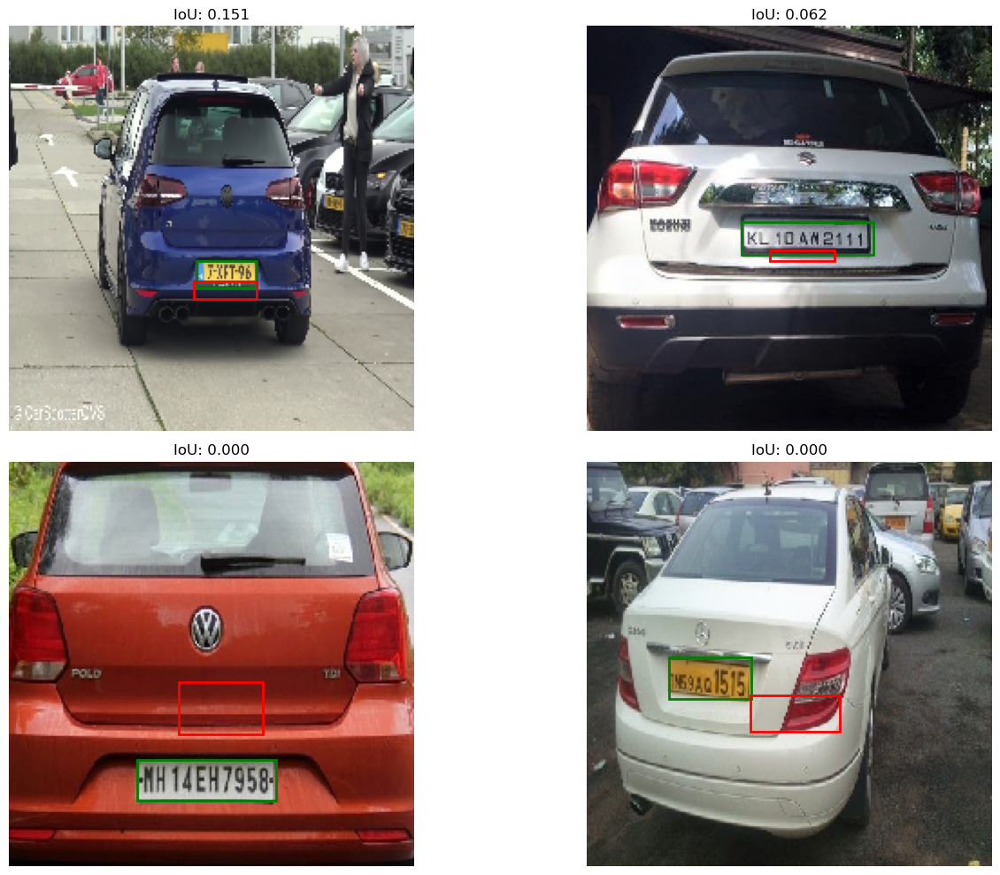

In [29]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random

# Select 4 random validation images
indices = random.sample(range(len(x_test)), 4)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

for ax, idx in zip(axes.flatten(), indices):

    # Display image
    ax.imshow(x_test[idx])

    true_box = y_test[idx]
    pred_box = predictions[idx]

    # Convert normalized coordinates to pixels
    true_xmin = true_box[0] * 224
    true_xmax = true_box[1] * 224
    true_ymin = true_box[2] * 224
    true_ymax = true_box[3] * 224

    pred_xmin = pred_box[0] * 224
    pred_xmax = pred_box[1] * 224
    pred_ymin = pred_box[2] * 224
    pred_ymax = pred_box[3] * 224

    # Ground truth box
    true_rect = patches.Rectangle(
        (true_xmin, true_ymin),
        true_xmax - true_xmin,
        true_ymax - true_ymin,
        linewidth=2,
        edgecolor='green',
        facecolor='none',
        label='Actual'
    )

    # Predicted box
    pred_rect = patches.Rectangle(
        (pred_xmin, pred_ymin),
        pred_xmax - pred_xmin,
        pred_ymax - pred_ymin,
        linewidth=2,
        edgecolor='red',
        facecolor='none',
        label='Predicted'
    )

    ax.add_patch(true_rect)
    ax.add_patch(pred_rect)

    ax.set_title(f"IoU: {ious[idx]:.3f}")

    ax.axis('off')

plt.tight_layout()
plt.show()

In [30]:
# Load the best model first
best_model.trainable = True

# Freeze most layers
for layer in best_model.layers[:-30]:
    layer.trainable = False

# Keep the last 30 layers trainable
for layer in best_model.layers[-30:]:
    layer.trainable = True

In [31]:
trainable_count = sum(
    [layer.trainable for layer in best_model.layers]
)

print("Trainable layers:", trainable_count)
print("Total layers:", len(best_model.layers))

Trainable layers: 30
Total layers: 785


In [32]:
best_model.compile(
    optimizer=tf.keras.optimizers.Adam(
        learning_rate=0.00001
    ),
    loss='mse'
)

In [33]:
fine_callbacks = [

    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=7,
        restore_best_weights=True,
        verbose=1
    ),

    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
        verbose=1
    ),

    tf.keras.callbacks.ModelCheckpoint(
        'fine_tuned_number_plate_model.keras',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )
]

In [34]:
fine_history = best_model.fit(
    x_train,
    y_train,
    validation_data=(x_test, y_test),
    epochs=20,
    batch_size=4,
    callbacks=fine_callbacks,
    verbose=1
)

Epoch 1/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 667ms/step - loss: 0.0212
Epoch 1: val_loss improved from None to 0.01645, saving model to fine_tuned_number_plate_model.keras

Epoch 1: finished saving model to fine_tuned_number_plate_model.keras
45/45 ━━━━━━━━━━━━━━━━━━━━ 66s 1s/step - loss: 0.0212 - val_loss: 0.0165 - learning_rate: 1.0000e-05
Epoch 2/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0184
Epoch 2: val_loss did not improve from 0.01645
45/45 ━━━━━━━━━━━━━━━━━━━━ 35s 777ms/step - loss: 0.0184 - val_loss: 0.0172 - learning_rate: 1.0000e-05
Epoch 3/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 638ms/step - loss: 0.0170
Epoch 3: val_loss did not improve from 0.01645
45/45 ━━━━━━━━━━━━━━━━━━━━ 39s 874ms/step - loss: 0.0170 - val_loss: 0.0174 - learning_rate: 1.0000e-05
Epoch 4/20
45/45 ━━━━━━━━━━━━━━━━━━━━ 0s 636ms/step - loss: 0.0160
Epoch 4: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.

Epoch 4: val_loss did not improve from 0.01645
45/45 ━━━━━━━━━━━━━━━━━━━━ 36s 77

In [35]:
fine_predictions = best_model.predict(x_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 18s 8s/step


In [36]:
fine_ious = []

for true_box, pred_box in zip(y_test, fine_predictions):
    fine_ious.append(calculate_iou(true_box, pred_box))

print("Fine-tuned Mean IoU:", np.mean(fine_ious))
print("Fine-tuned Maximum IoU:", np.max(fine_ious))
print("Fine-tuned Minimum IoU:", np.min(fine_ious))

Fine-tuned Mean IoU: 0.19511051
Fine-tuned Maximum IoU: 0.6388691
Fine-tuned Minimum IoU: 0.0


In [37]:
!pip install ultralytics

   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   -------------- ------------------------- 0.5/1.4 MB 4.5 MB/s eta 0:00:01
   ---------------------------------------- 1.4/1.4 MB 4.4 MB/s  0:00:00
   ---------------------------------------- 0.0/865.2 kB ? eta -:--:--
   ------------------------------------ --- 786.4/865.2 kB 3.6 MB/s eta 0:00:01
   ---------------------------------------- 865.2/865.2 kB 3.2 MB/s  0:00:00
   ---------------------------------------- 0.0/53.7 MB ? eta -:--:--
    --------------------------------------- 1.0/53.7 MB 5.7 MB/s eta 0:00:10
   - -------------------------------------- 1.8/53.7 MB 5.7 MB/s eta 0:00:10
   -- ------------------------------------- 2.9/53.7 MB 4.7 MB/s eta 0:00:11
   -- ------------------------------------- 3.4/53.7 MB 4.4 MB/s eta 0:00:12
   -- ------------------------------------- 3.7/53.7 MB 3.7 MB/s eta 0:00:14
   --- ------------------------------------ 4.5/53.7 MB 3.6 MB/s eta 0:00:14
   ---- --------------

In [38]:
from ultralytics import YOLO

print("Ultralytics imported successfully!")

Creating new Ultralytics Settings v0.0.8 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\Admin\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Ultralytics imported successfully!


In [39]:
import os

SOURCE_PATH = r"C:\Users\Admin\Downloads\archive (7)\images"

YOLO_PATH = r"C:\Users\Admin\Downloads\archive (7)\TEST"

In [40]:
print("Source exists:", os.path.exists(SOURCE_PATH))

Source exists: True


In [41]:
import os

folders = [

    os.path.join(YOLO_PATH, "images", "train"),
    os.path.join(YOLO_PATH, "images", "val"),

    os.path.join(YOLO_PATH, "labels", "train"),
    os.path.join(YOLO_PATH, "labels", "val")
]

for folder in folders:
    os.makedirs(folder, exist_ok=True)

print("YOLO folders created successfully!")

YOLO folders created successfully!


In [42]:
import xml.etree.ElementTree as ET

def convert_xml_to_yolo(xml_path, image_width, image_height):

    tree = ET.parse(xml_path)
    root = tree.getroot()

    yolo_annotations = []

    for obj in root.findall("object"):

        # We have only one class
        class_id = 0

        bbox = obj.find("bndbox")

        xmin = float(bbox.find("xmin").text)
        ymin = float(bbox.find("ymin").text)
        xmax = float(bbox.find("xmax").text)
        ymax = float(bbox.find("ymax").text)

        # Convert to YOLO format
        x_center = ((xmin + xmax) / 2) / image_width
        y_center = ((ymin + ymax) / 2) / image_height

        width = (xmax - xmin) / image_width
        height = (ymax - ymin) / image_height

        yolo_annotations.append(
            f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
        )

    return yolo_annotations

In [43]:
import cv2
import shutil
import random
from sklearn.model_selection import train_test_split

# Get XML files
xml_files = [

    file for file in os.listdir(SOURCE_PATH)

    if file.lower().endswith(".xml")
]

print("Total XML files:", len(xml_files))


# Split dataset
train_xml, val_xml = train_test_split(
    xml_files,
    test_size=0.20,
    random_state=42
)

print("Training samples:", len(train_xml))
print("Validation samples:", len(val_xml))

Total XML files: 225
Training samples: 180
Validation samples: 45


In [44]:
def process_dataset(xml_list, split):

    for xml_file in xml_list:

        base_name = os.path.splitext(xml_file)[0]

        xml_path = os.path.join(
            SOURCE_PATH,
            xml_file
        )

        # Find corresponding image
        image_path = None

        for ext in [".jpeg", ".jpg", ".png"]:

            possible_path = os.path.join(
                SOURCE_PATH,
                base_name + ext
            )

            if os.path.exists(possible_path):

                image_path = possible_path
                break

        if image_path is None:

            print("Image not found:", base_name)
            continue


        # Read image dimensions
        image = cv2.imread(image_path)

        if image is None:

            print("Could not read:", image_path)
            continue

        height, width = image.shape[:2]


        # Convert XML annotation
        yolo_annotations = convert_xml_to_yolo(
            xml_path,
            width,
            height
        )


        # Destination paths
        image_destination = os.path.join(
            YOLO_PATH,
            "images",
            split,
            os.path.basename(image_path)
        )

        label_destination = os.path.join(
            YOLO_PATH,
            "labels",
            split,
            base_name + ".txt"
        )


        # Copy image
        shutil.copy(
            image_path,
            image_destination
        )


        # Save YOLO label
        with open(label_destination, "w") as file:

            for annotation in yolo_annotations:

                file.write(annotation + "\n")

In [45]:
process_dataset(
    train_xml,
    "train"
)

process_dataset(
    val_xml,
    "val"
)

print("Dataset conversion completed!")

Dataset conversion completed!


In [46]:
print(
    "Training images:",
    len(os.listdir(os.path.join(YOLO_PATH, "images", "train")))
)

print(
    "Validation images:",
    len(os.listdir(os.path.join(YOLO_PATH, "images", "val")))
)

print(
    "Training labels:",
    len(os.listdir(os.path.join(YOLO_PATH, "labels", "train")))
)

print(
    "Validation labels:",
    len(os.listdir(os.path.join(YOLO_PATH, "labels", "val")))
)

Training images: 180
Validation images: 45
Training labels: 180
Validation labels: 45


In [47]:
yaml_content = f"""
path: {YOLO_PATH}

train: images/train
val: images/val

nc: 1

names:
  0: license_plate
"""

yaml_path = os.path.join(
    YOLO_PATH,
    "data.yaml"
)

with open(yaml_path, "w") as file:

    file.write(yaml_content)

print("data.yaml created!")

data.yaml created!


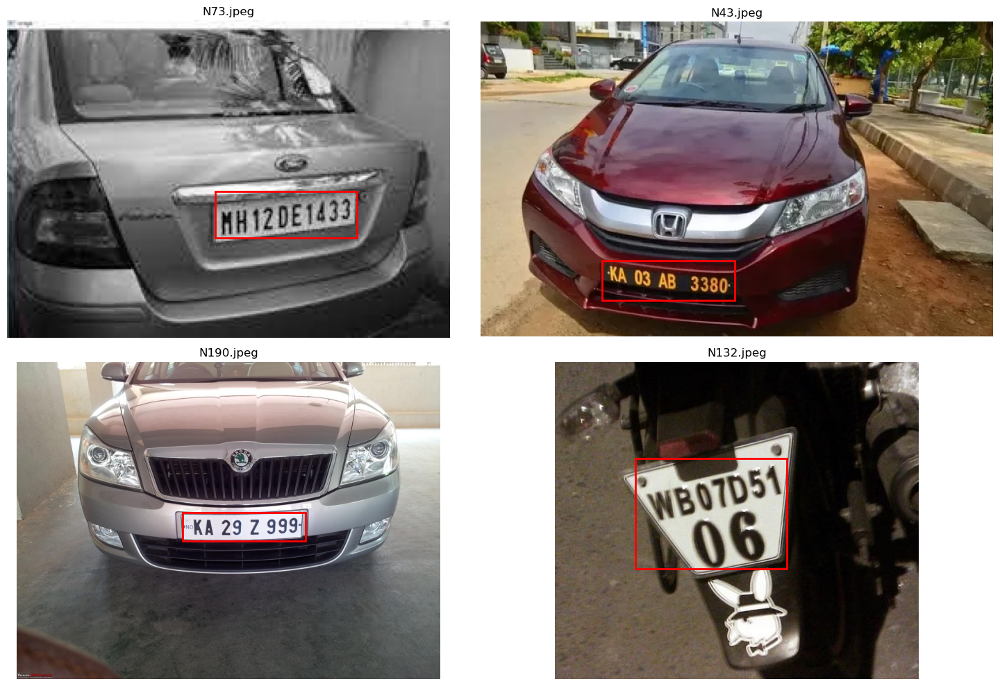

In [48]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random

train_image_folder = os.path.join(
    YOLO_PATH,
    "images",
    "train"
)

train_label_folder = os.path.join(
    YOLO_PATH,
    "labels",
    "train"
)

image_files = os.listdir(train_image_folder)

sample_images = random.sample(image_files, 4)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))


for ax, image_file in zip(axes.flatten(), sample_images):

    image_path = os.path.join(
        train_image_folder,
        image_file
    )

    image = cv2.cvtColor(
        cv2.imread(image_path),
        cv2.COLOR_BGR2RGB
    )

    h, w = image.shape[:2]

    label_file = (
        os.path.splitext(image_file)[0]
        + ".txt"
    )

    label_path = os.path.join(
        train_label_folder,
        label_file
    )

    with open(label_path, "r") as file:

        line = file.readline().strip()

    values = line.split()

    class_id = int(values[0])

    x_center = float(values[1])
    y_center = float(values[2])

    box_width = float(values[3])
    box_height = float(values[4])


    # Convert back to pixels
    xmin = (
        x_center - box_width / 2
    ) * w

    ymin = (
        y_center - box_height / 2
    ) * h

    width_box = box_width * w
    height_box = box_height * h


    ax.imshow(image)

    rect = patches.Rectangle(
        (xmin, ymin),
        width_box,
        height_box,
        linewidth=2,
        edgecolor="red",
        facecolor="none"
    )

    ax.add_patch(rect)

    ax.axis("off")

    ax.set_title(image_file)


plt.tight_layout()
plt.show()

In [49]:
from ultralytics import YOLO
import ultralytics

print("Ultralytics version:", ultralytics.__version__)

Ultralytics version: 8.4.138


In [50]:
model = YOLO("yolo11n.pt")

print("YOLO model loaded successfully!")

YOLO model loaded successfully!


In [51]:
results = model.train(
    data=yaml_path,
    
    epochs=75,
    
    imgsz=640,
    
    batch=4,
    
    device="cpu",
    
    patience=15,
    
    workers=0,
    
    project="number_plate_detection",
    
    name="yolo11_license_plate",
    
    pretrained=True
)

Ultralytics 8.4.138  Python-3.13.9 torch-2.14.0+cpu CPU (Intel Core i7-7600U 2.80GHz)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\Admin\Downloads\archive (7)\TEST\data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=75, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11_

In [52]:
metrics = model.val(
    data=yaml_path,
    imgsz=640,
    batch=4,
    device="cpu",
    workers=0
)

print(metrics)

Ultralytics 8.4.138  Python-3.13.9 torch-2.14.0+cpu CPU (Intel Core i7-7600U 2.80GHz)
YOLO11n summary (fused): 101 layers, 2,582,347 parameters, 0 gradients, 6.4 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 357.8390.0 MB/s, size: 146.1 KB)
val: Scanning C:\Users\Admin\Downloads\archive (7)\TEST\labels\val.cache... 45 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 45/45 7.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 1.2it/s 10.4s1.0s
                   all         45         45      0.877      0.978      0.973      0.635
Speed: 3.4ms preprocess, 199.7ms inference, 0.0ms loss, 4.3ms postprocess per image
Results saved to C:\Users\Admin\runs\detect\val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x0000014057D35710>
curves: ['Precision-R

In [54]:
import os

for root, dirs, files in os.walk(os.getcwd()):
    if "best.pt" in files:
        print("FOUND:", os.path.join(root, "best.pt"))

In [55]:
import os

print("Current working directory:")
print(os.getcwd())

print("\nFiles and folders here:")
print(os.listdir())

Current working directory:
C:\Users\Admin\project8

Files and folders here:
['.ipynb_checkpoints', 'best_number_plate_model.keras', 'fine_tuned_number_plate_model.keras', 'NumberPlate.ipynb', 'yolo11n.pt']


In [56]:
import glob

best_files = glob.glob(r"C:\Users\Admin\**\best.pt", recursive=True)

print(best_files)

['C:\\Users\\Admin\\runs\\detect\\number_plate_detection\\yolo11_license_plate\\weights\\best.pt']


In [57]:
from ultralytics import YOLO

best_model = YOLO(
    r"C:\\Users\\Admin\\runs\\detect\\number_plate_detection\\yolo11_license_plate\\weights\\best.pt"
)

print("Best model loaded successfully!")

Best model loaded successfully!


In [58]:
import os
import random
import matplotlib.pyplot as plt

val_images_path = os.path.join(
    YOLO_PATH,
    "images",
    "val"
)

val_images = [
    f for f in os.listdir(val_images_path)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
]

sample_images = random.sample(val_images, min(5, len(val_images)))

sample_paths = [
    os.path.join(val_images_path, image)
    for image in sample_images
]

results = best_model.predict(
    source=sample_paths,
    conf=0.25,
    imgsz=640,
    device="cpu"
)

print("Predictions completed!")


0: 640x640 3 license_plates, 216.9ms
1: 640x640 1 license_plate, 216.9ms
2: 640x640 1 license_plate, 216.9ms
3: 640x640 1 license_plate, 216.9ms
4: 640x640 1 license_plate, 216.9ms
Speed: 17.1ms preprocess, 216.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)
Predictions completed!


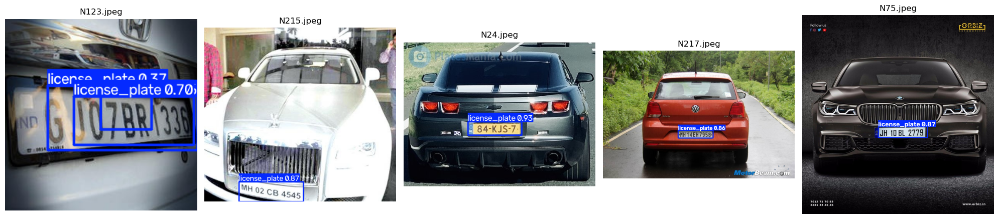

In [59]:
fig, axes = plt.subplots(1, len(results), figsize=(20, 5))

# Handle the case where only one image is selected
if len(results) == 1:
    axes = [axes]

for ax, result, image_name in zip(axes, results, sample_images):

    # YOLO result.plot() returns BGR
    annotated_image = result.plot()[:, :, ::-1]

    ax.imshow(annotated_image)
    ax.set_title(image_name)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [60]:
for image_name, result in zip(sample_images, results):

    print("\nImage:", image_name)

    boxes = result.boxes

    if len(boxes) == 0:
        print("No license plate detected")

    else:
        for box in boxes:

            confidence = float(box.conf[0])
            class_id = int(box.cls[0])

            print(
                f"Class: {class_id} | "
                f"Confidence: {confidence:.3f}"
            )


Image: N123.jpeg
Class: 0 | Confidence: 0.697
Class: 0 | Confidence: 0.373
Class: 0 | Confidence: 0.349

Image: N215.jpeg
Class: 0 | Confidence: 0.867

Image: N24.jpeg
Class: 0 | Confidence: 0.932

Image: N217.jpeg
Class: 0 | Confidence: 0.862

Image: N75.jpeg
Class: 0 | Confidence: 0.874


In [61]:
metrics = best_model.val(
    data=yaml_path,
    imgsz=640,
    batch=4,
    device="cpu",
    workers=0
)

Ultralytics 8.4.138  Python-3.13.9 torch-2.14.0+cpu CPU (Intel Core i7-7600U 2.80GHz)
val: Fast image access  (ping: 0.10.0 ms, read: 119.560.0 MB/s, size: 93.2 KB)
val: Scanning C:\Users\Admin\Downloads\archive (7)\TEST\labels\val.cache... 45 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 45/45 460.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 1.3it/s 9.1s0.9s
                   all         45         45      0.877      0.978      0.973      0.635
Speed: 3.1ms preprocess, 172.5ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to C:\Users\Admin\runs\detect\val-2


In [62]:
print("mAP50:", metrics.box.map50)
print("mAP50-95:", metrics.box.map)
print("Precision:", metrics.box.mp)
print("Recall:", metrics.box.mr)

mAP50: 0.9727186855382061
mAP50-95: 0.6346836304368407
Precision: 0.8765545946285433
Recall: 0.9777777777777777


In [63]:
def detect_license_plate(image_path, confidence=0.25):

    results = best_model.predict(
        source=image_path,
        conf=confidence,
        imgsz=640,
        device="cpu"
    )

    result = results[0]

    annotated_image = result.plot()[:, :, ::-1]

    plt.figure(figsize=(12, 8))
    plt.imshow(annotated_image)
    plt.title("License Plate Detection")
    plt.axis("off")
    plt.show()

    # Print detections
    if len(result.boxes) == 0:
        print("No license plate detected.")

    else:
        for box in result.boxes:
            print(
                "Confidence:",
                round(float(box.conf[0]), 3)
            )

    return result


image 1/1 C:\Users\Admin\Downloads\archive (7)\TEST\images\val\N123.jpeg: 640x640 3 license_plates, 526.8ms
Speed: 10.3ms preprocess, 526.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


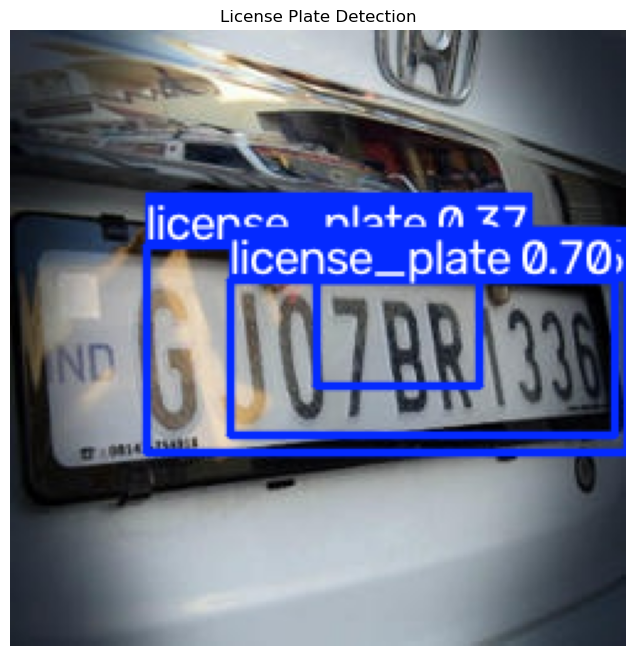

Confidence: 0.697
Confidence: 0.373
Confidence: 0.349


ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
depth: None
keypoints: None
masks: None
names: {0: 'license_plate'}
obb: None
orig_img: array([[[59, 46, 44],
        [59, 46, 44],
        [59, 47, 43],
        ...,
        [49, 40, 36],
        [49, 43, 38],
        [49, 43, 38]],

       [[59, 46, 44],
        [59, 47, 43],
        [60, 48, 44],
        ...,
        [48, 39, 35],
        [53, 44, 40],
        [51, 45, 40]],

       [[61, 46, 43],
        [62, 48, 42],
        [60, 48, 42],
        ...,
        [49, 38, 34],
        [54, 43, 39],
        [52, 43, 39]],

       ...,

       [[45, 35, 28],
        [45, 35, 28],
        [46, 36, 29],
        ...,
        [54, 41, 33],
        [52, 38, 32],
        [52, 38, 32]],

       [[43, 33, 26],
        [43, 33, 26],
        [44, 34, 27],
        ...,
        [52, 38, 32],
        [51, 37, 31],
        [51, 37, 31]],

       [[43, 33, 26],
        [43, 33, 26],
        [44, 

In [64]:
detect_license_plate(
    sample_paths[0]
)

In [65]:
metrics = best_model.val(
    data=yaml_path,
    imgsz=640,
    batch=4,
    device="cpu",
    workers=0
)

Ultralytics 8.4.138  Python-3.13.9 torch-2.14.0+cpu CPU (Intel Core i7-7600U 2.80GHz)
val: Fast image access  (ping: 0.10.0 ms, read: 126.3102.7 MB/s, size: 100.2 KB)
val: Scanning C:\Users\Admin\Downloads\archive (7)\TEST\labels\val.cache... 45 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 45/45 5.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 1.2it/s 10.3s1.1s
                   all         45         45      0.877      0.978      0.973      0.635
Speed: 6.1ms preprocess, 191.1ms inference, 0.0ms loss, 4.1ms postprocess per image
Results saved to C:\Users\Admin\runs\detect\val-3


In [66]:
print("Final YOLO Performance")
print("-" * 30)

print("mAP@50:", round(metrics.box.map50, 4))
print("mAP@50-95:", round(metrics.box.map, 4))
print("Precision:", round(metrics.box.mp, 4))
print("Recall:", round(metrics.box.mr, 4))

Final YOLO Performance
------------------------------
mAP@50: 0.9727
mAP@50-95: 0.6347
Precision: 0.8766
Recall: 0.9778


In [67]:
results = best_model.predict(
    source=sample_paths,
    conf=0.50,
    imgsz=640,
    device="cpu"
)

print("Predictions completed!")


0: 640x640 1 license_plate, 210.7ms
1: 640x640 1 license_plate, 210.7ms
2: 640x640 1 license_plate, 210.7ms
3: 640x640 1 license_plate, 210.7ms
4: 640x640 1 license_plate, 210.7ms
Speed: 15.1ms preprocess, 210.7ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)
Predictions completed!


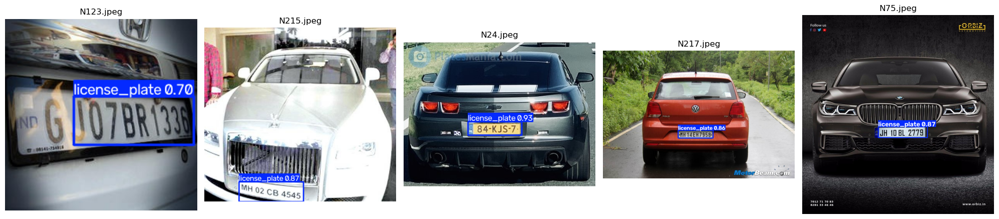

In [68]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, len(results), figsize=(20, 5))

if len(results) == 1:
    axes = [axes]

for ax, result, image_name in zip(
    axes,
    results,
    sample_images
):

    annotated_image = result.plot()[:, :, ::-1]

    ax.imshow(annotated_image)
    ax.set_title(image_name)
    ax.axis("off")

plt.tight_layout()
plt.show()

In [69]:
def detect_license_plate(image_path, confidence=0.50):

    results = best_model.predict(
        source=image_path,
        conf=confidence,
        imgsz=640,
        device="cpu"
    )

    result = results[0]

    annotated_image = result.plot()[:, :, ::-1]

    plt.figure(figsize=(10, 7))

    plt.imshow(annotated_image)

    plt.title("License Plate Detection")

    plt.axis("off")

    plt.show()

    if len(result.boxes) == 0:

        print("No license plate detected.")

    else:

        print("License plate detected!")

        for box in result.boxes:

            confidence_score = float(box.conf[0])

            print(
                f"Confidence: {confidence_score:.3f}"
            )

    return result


image 1/1 C:\Users\Admin\Downloads\archive (7)\TEST\images\val\N123.jpeg: 640x640 1 license_plate, 336.4ms
Speed: 11.2ms preprocess, 336.4ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


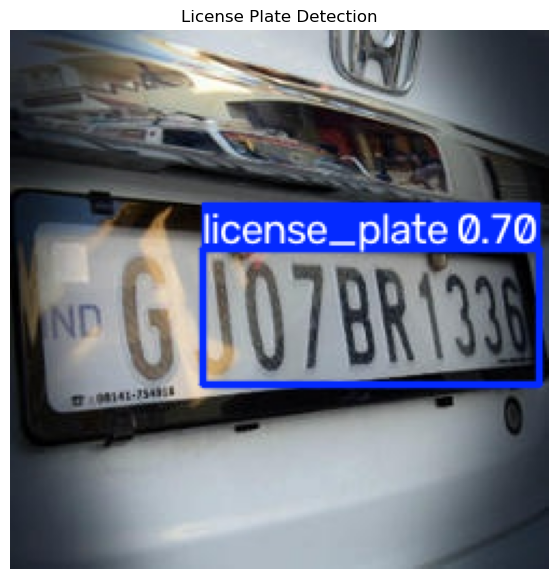

License plate detected!
Confidence: 0.697


ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
depth: None
keypoints: None
masks: None
names: {0: 'license_plate'}
obb: None
orig_img: array([[[59, 46, 44],
        [59, 46, 44],
        [59, 47, 43],
        ...,
        [49, 40, 36],
        [49, 43, 38],
        [49, 43, 38]],

       [[59, 46, 44],
        [59, 47, 43],
        [60, 48, 44],
        ...,
        [48, 39, 35],
        [53, 44, 40],
        [51, 45, 40]],

       [[61, 46, 43],
        [62, 48, 42],
        [60, 48, 42],
        ...,
        [49, 38, 34],
        [54, 43, 39],
        [52, 43, 39]],

       ...,

       [[45, 35, 28],
        [45, 35, 28],
        [46, 36, 29],
        ...,
        [54, 41, 33],
        [52, 38, 32],
        [52, 38, 32]],

       [[43, 33, 26],
        [43, 33, 26],
        [44, 34, 27],
        ...,
        [52, 38, 32],
        [51, 37, 31],
        [51, 37, 31]],

       [[43, 33, 26],
        [43, 33, 26],
        [44, 

In [70]:
detect_license_plate(sample_paths[0])

In [71]:
import os
import shutil

os.makedirs("models", exist_ok=True)

print("Models folder created!")

Models folder created!


In [73]:
BEST_MODEL_PATH = r"C:\Users\Admin\runs\detect\number_plate_detection\yolo11_license_plate\weights\best.pt"

In [74]:
import os

print(os.path.exists(BEST_MODEL_PATH))

True


In [75]:
import shutil
import os

os.makedirs("models", exist_ok=True)

shutil.copy(
    BEST_MODEL_PATH,
    "models/best.pt"
)

print("Best model copied successfully!")

Best model copied successfully!


In [76]:
print(os.listdir("models"))

['best.pt']
